In [37]:
#Imports

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt


The goals / steps of this project are the following:

1) Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

2) Apply a distortion correction to raw images.

3) Use color transforms, gradients, etc., to create a thresholded binary image.

4) Apply a perspective transform to rectify binary image ("birds-eye view").

5) Detect lane pixels and fit to find the lane boundary.

6) Determine the curvature of the lane and vehicle position with respect to center.

7) Warp the detected lane boundaries back onto the original image.

8) Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


The first steps is to compute the camera calibration matrix using a set of chessboard images.


Input Image:


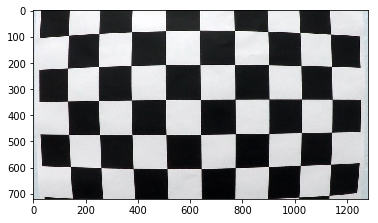

No chessboard croners found for this image


Input Image:


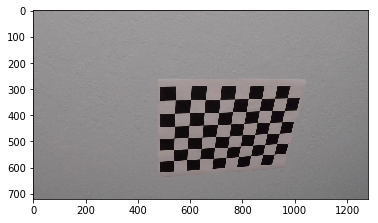

Output Image with chessboard corners:


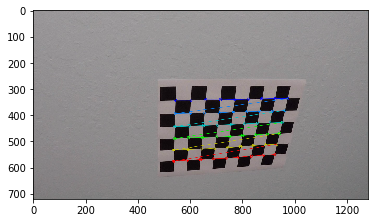

Input Image:


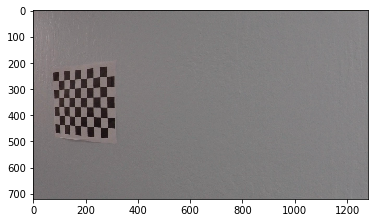

Output Image with chessboard corners:


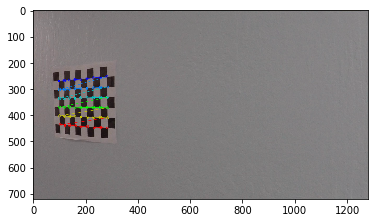

Input Image:


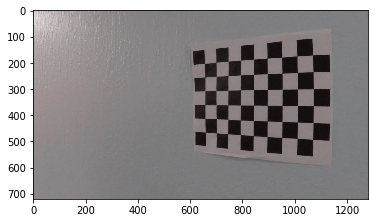

Output Image with chessboard corners:


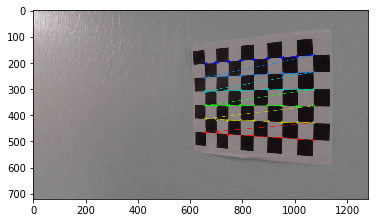

Input Image:


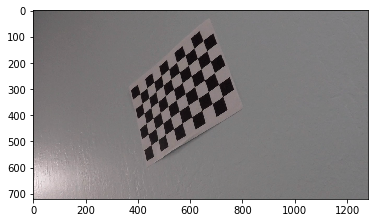

Output Image with chessboard corners:


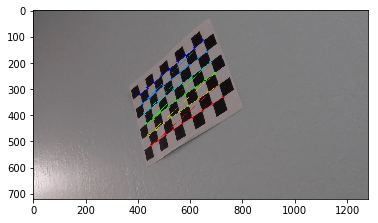

Input Image:


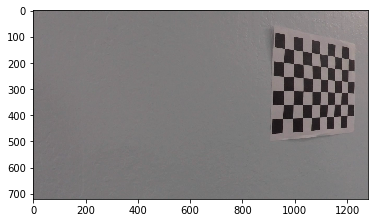

Output Image with chessboard corners:


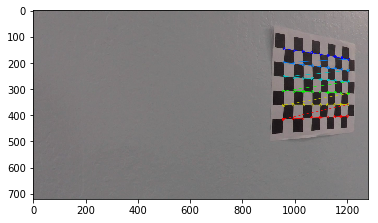

Input Image:


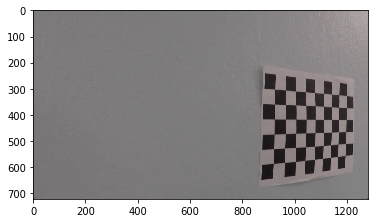

Output Image with chessboard corners:


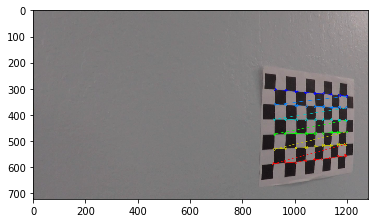

Input Image:


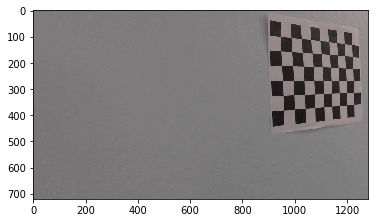

Output Image with chessboard corners:


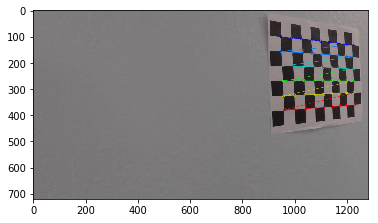

Input Image:


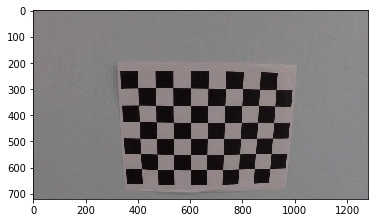

Output Image with chessboard corners:


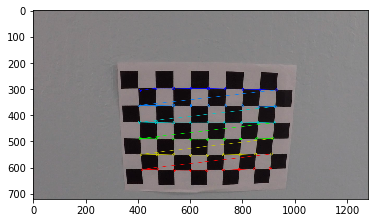

Input Image:


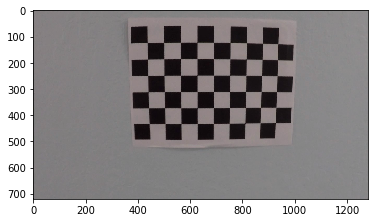

Output Image with chessboard corners:


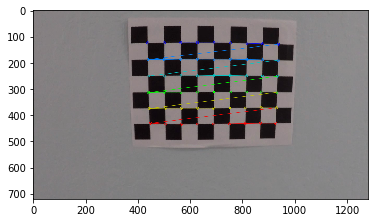

Input Image:


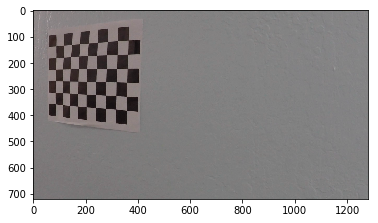

Output Image with chessboard corners:


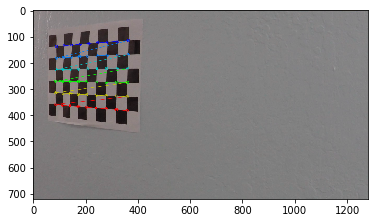

Input Image:


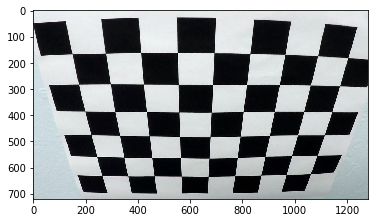

Output Image with chessboard corners:


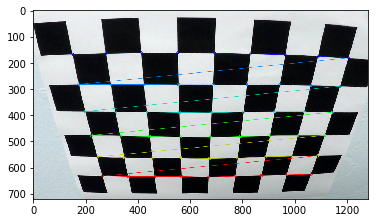

Input Image:


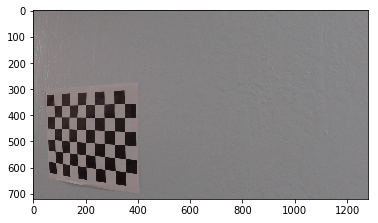

Output Image with chessboard corners:


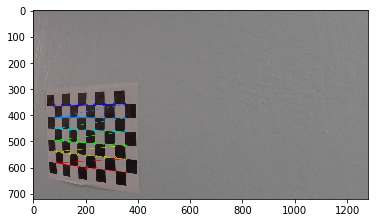

Input Image:


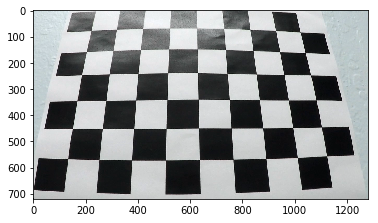

Output Image with chessboard corners:


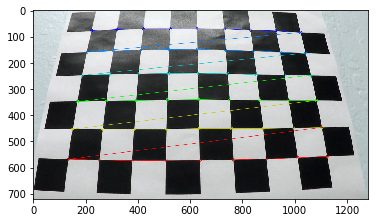

Input Image:


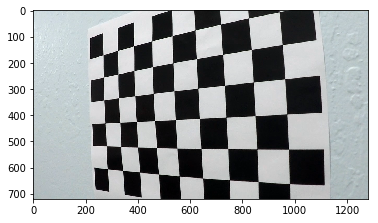

No chessboard croners found for this image


Input Image:


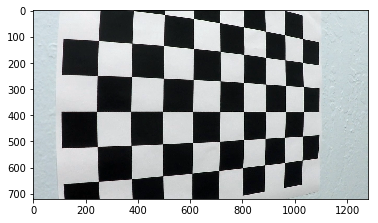

No chessboard croners found for this image


Input Image:


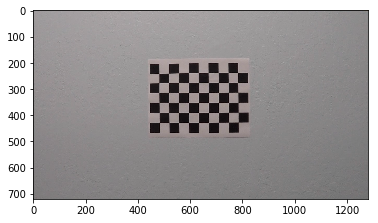

Output Image with chessboard corners:


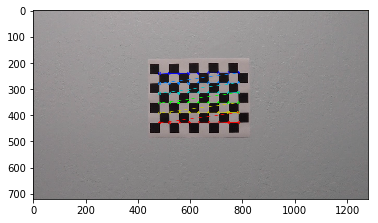

Input Image:


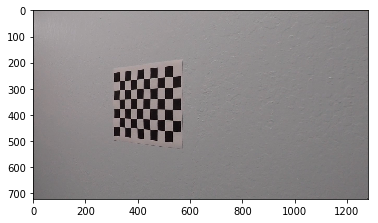

Output Image with chessboard corners:


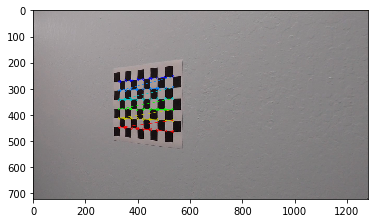

Input Image:


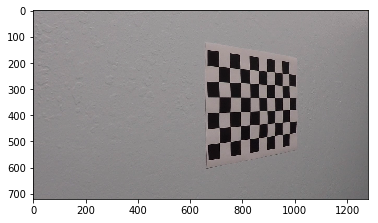

Output Image with chessboard corners:


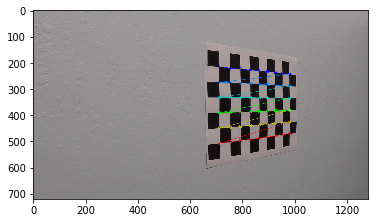

Input Image:


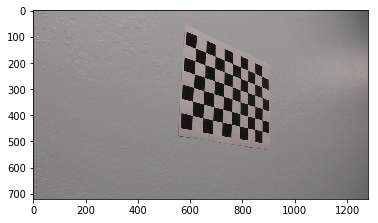

Output Image with chessboard corners:


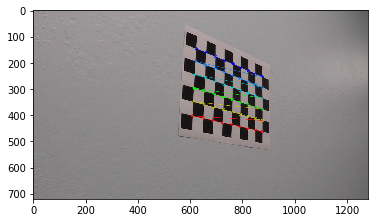

In [38]:
# Camera calibration

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    print("Input Image:")
    plt.imshow(img)
    plt.show()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        print("Output Image with chessboard corners:")
        plt.imshow(img)
        plt.show()
    else:
        print("No chessboard croners found for this image\n\n")
        
    print("=====================================================")




Original image:


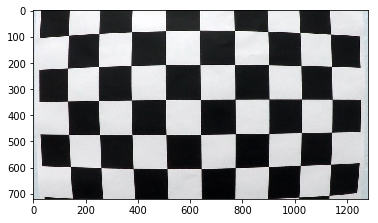

Undistorted image:


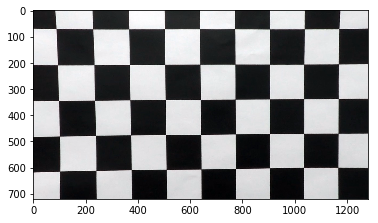

In [39]:
# Obtain the camera calibration matrix

img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# Undistort the image using the matrix
dst = cv2.undistort(img, mtx, dist, None, mtx)

# output 
cv2.imwrite('./output_images/calibration1_undist.jpg',dst)
print("Original image:")
plt.imshow(img)
plt.show()

print("Undistorted image:")
plt.imshow(dst)
plt.show()


In [40]:
# takes RGB image as input
def undistort(img):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst


Original image:


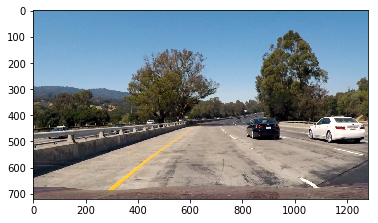

Undistorted image:


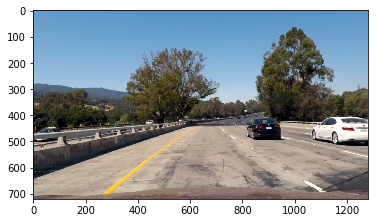

True

In [41]:
# test distort correction on test image
img = cv2.imread('./test_images/test1.jpg')
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print("Original image:")
plt.imshow(img1)
plt.show()

dst_img = undistort(img1)

print("Undistorted image:")
plt.imshow(dst_img)
plt.show()
cv2.imwrite('./output_images/test1_undist.jpg',cv2.cvtColor(dst_img, cv2.COLOR_BGR2RGB))



In [42]:
# abs_sobel_thresh
def abs_sobel_thresh(img):

    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 20
    thresh_max = 255
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    return sxbinary


# magnitude threshold
def magnitude_thresh(img):
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude 
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    # 5) Create a binary mask where mag thresholds are met
    
    thresh_min = 25
    thresh_max = 255
    smbinary = np.zeros_like(scaled_sobel)  
    smbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
     
    return smbinary

# Directional Threshold
def directional_thresh(img):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=7)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=7)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
        
    thresh_min = 0
    thresh_max = 0.9
    sdbinary =  np.zeros_like(grad_dir)
    sdbinary[(grad_dir >= thresh_min) & (grad_dir <= thresh_max)] = 1
    return sdbinary


# Color transforms

def hls_sthresh(img):

    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Threshold color channel
    s_thresh_min = 100
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    return s_binary


def luv_lthresh(img):
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    l_channel = luv[:,:,0]

    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel > l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    return l_binary

def lab_bthresh(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    b_channel = lab[:,:,2]
    
    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel > b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    return b_binary


def rgb_rthresh(img):

    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    rgb = cv2.cvtColor(img, cv2.COLOR_Lab2RGB)
    
    r_channel = rgb[:,:,0]
    
    r_thresh_min = 225
    r_thresh_max = 255
    r_binary = np.zeros_like(r_channel)
    r_binary[(r_channel >= r_thresh_min) & (r_channel <= r_thresh_max)] = 1
    return r_binary


def rgb_gthresh(img):

    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    rgb = cv2.cvtColor(img, cv2.COLOR_Lab2RGB)
    
    g_channel = rgb[:,:,1]
    
    g_thresh_min = 225
    g_thresh_max = 255
    g_binary = np.zeros_like(g_channel)
    g_binary[(g_channel > g_thresh_min) & (g_channel <= g_thresh_max)] = 1
    return g_binary

def rgb_bthresh(img):

    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    rgb = cv2.cvtColor(img, cv2.COLOR_Lab2RGB)
    
    rgb_b_channel = rgb[:,:,2]
    
    rgb_b_thresh_min =10
    rgb_b_thresh_max = 255
    rgb_b_binary = np.zeros_like(rgb_b_channel)
    rgb_b_binary[(rgb_b_channel > rgb_b_thresh_min) & (rgb_b_channel <= rgb_b_thresh_max)] = 1
    return rgb_b_binary

def combine_binary(binary1, binary2):
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(binary1)
    combined_binary[(binary1 == 1) | (binary2 == 1)] = 1
    
    return combined_binary
    


In [43]:
# Helper function to diplay the images
def display_side_by_side(image1, image2, title1, title2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(image1)
    ax1.set_title(title1, fontsize=20)
    ax2.imshow(image2)
    ax2.set_title(title2, fontsize=20)
    

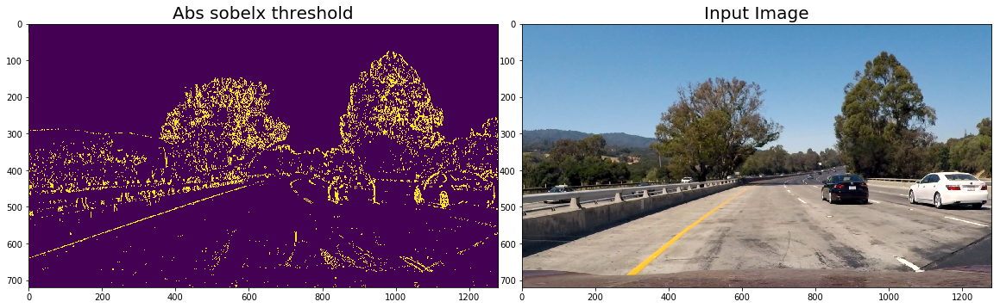

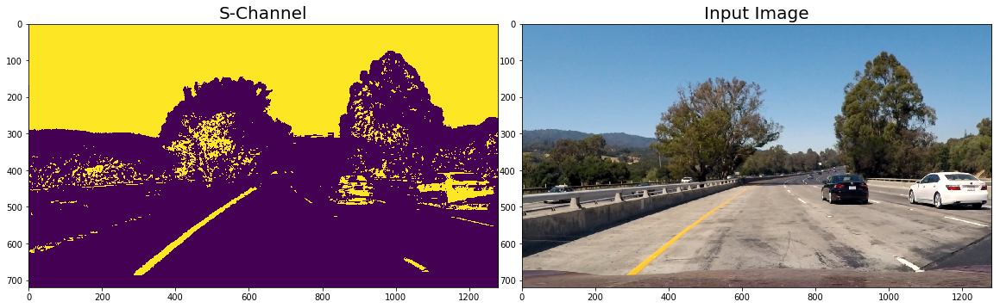

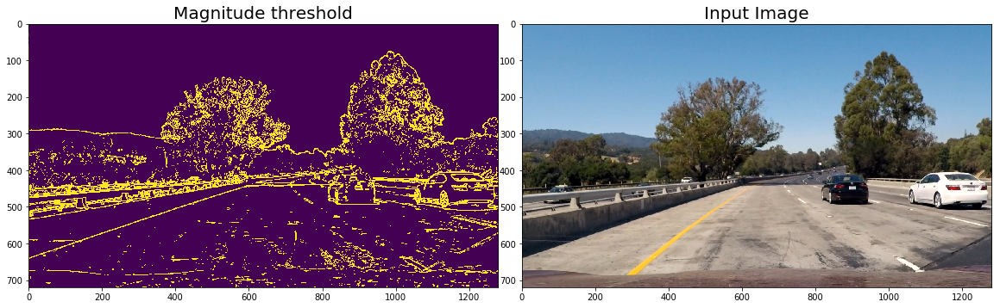

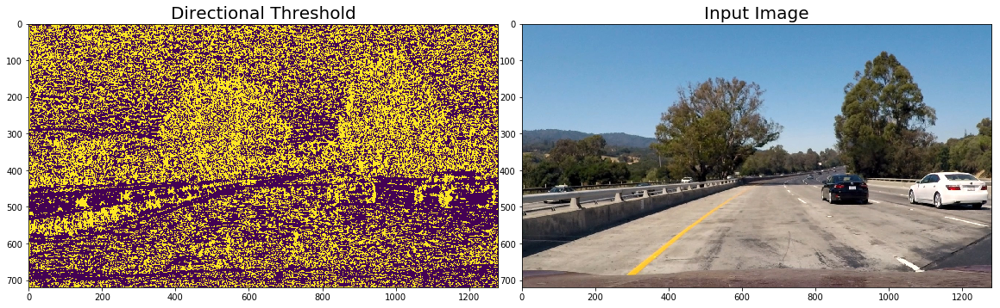

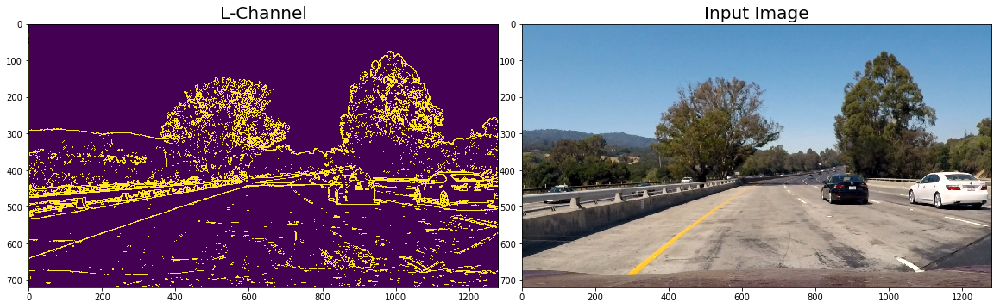

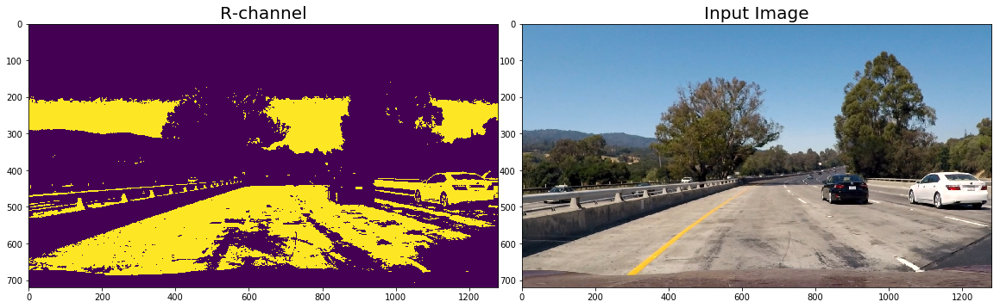

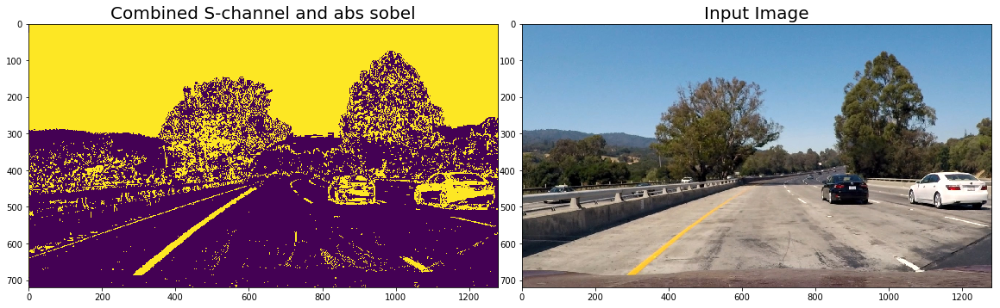

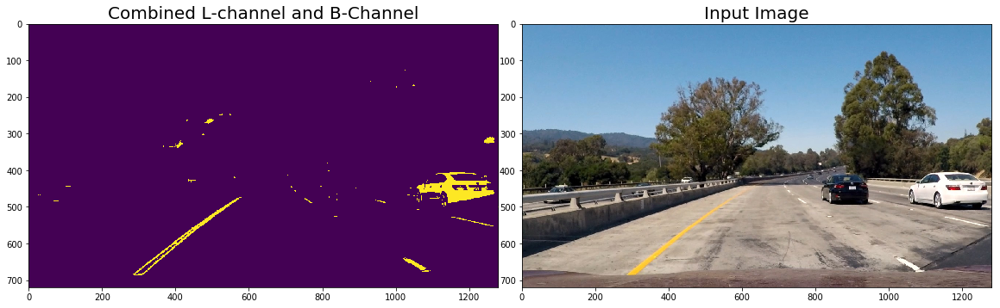

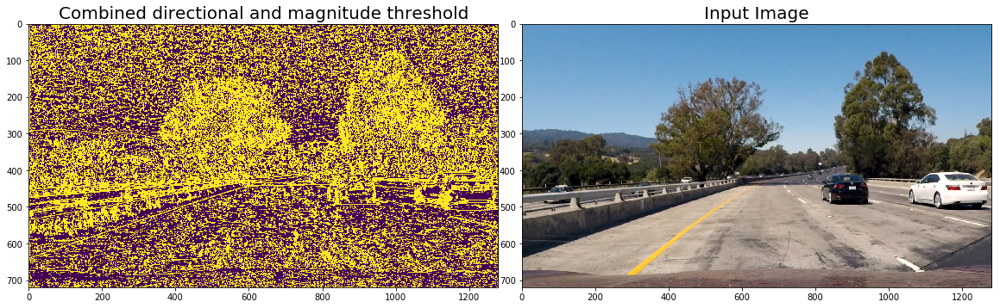

In [44]:
# Test various thresholds
img = cv2.imread('./test_images/test1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
sx_binary = abs_sobel_thresh(img)
s_binary = hls_sthresh(img)
smbinary = magnitude_thresh(img)
sdbinary = directional_thresh(img)
lbinary = luv_lthresh(img)
bbinary = lab_bthresh(img)
rbinary = rgb_rthresh(img)

display_side_by_side(sx_binary, img, "Abs sobelx threshold", "Input Image")
display_side_by_side(s_binary, img, "S-Channel", "Input Image")
display_side_by_side(smbinary, img, "Magnitude threshold", "Input Image")
display_side_by_side(sdbinary, img, "Directional Threshold", "Input Image")
display_side_by_side(smbinary, img, "L-Channel", "Input Image")
display_side_by_side(rbinary, img, "R-channel", "Input Image")

combined_binary = combine_binary(sx_binary, s_binary)       
display_side_by_side(combined_binary, img, "Combined S-channel and abs sobel", "Input Image")

combined_binary = combine_binary(lbinary, bbinary)
display_side_by_side(combined_binary, img, "Combined L-channel and B-Channel", "Input Image")

combined_binary = combine_binary(sdbinary, smbinary)
display_side_by_side(combined_binary, img, "Combined directional and magnitude threshold", "Input Image")

plt.show()


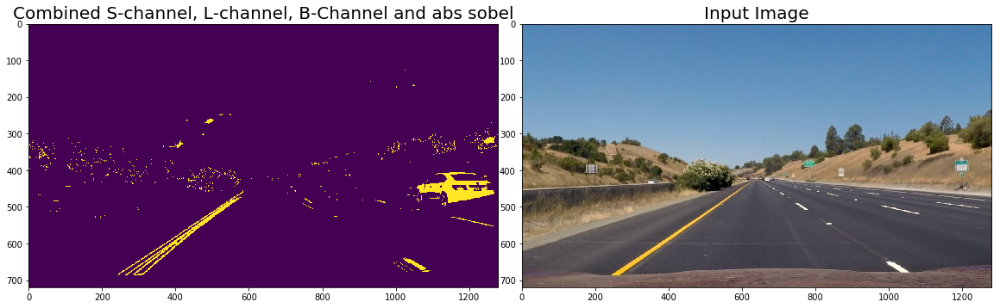

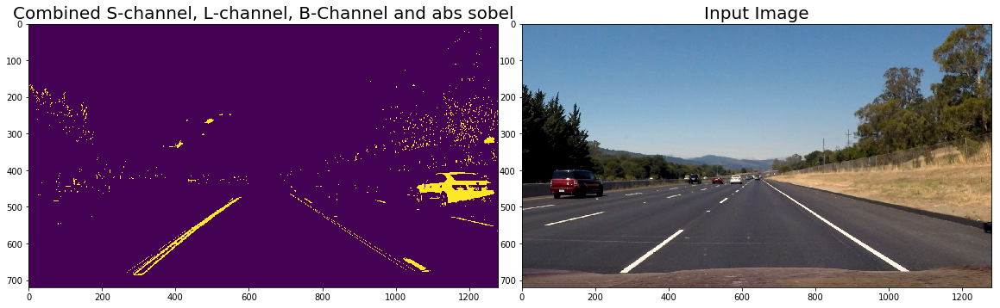

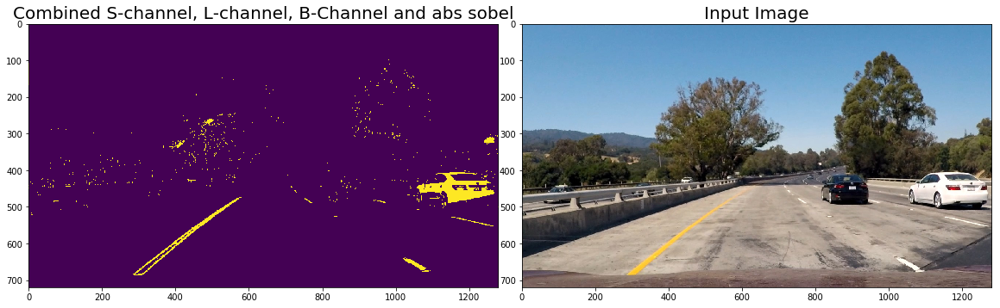

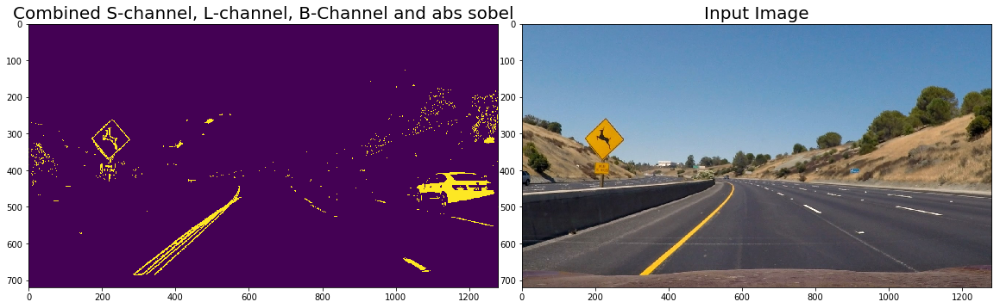

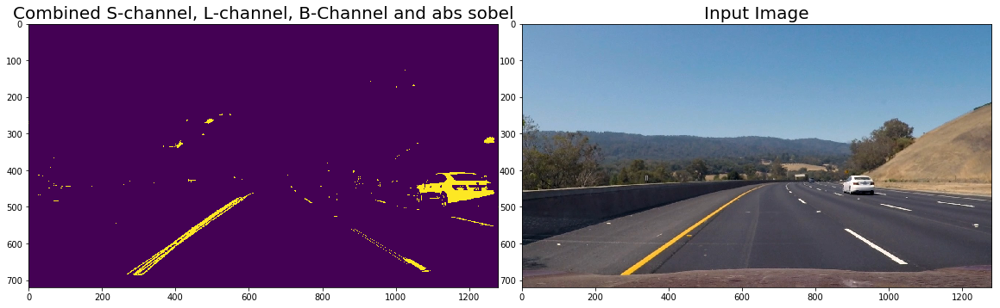

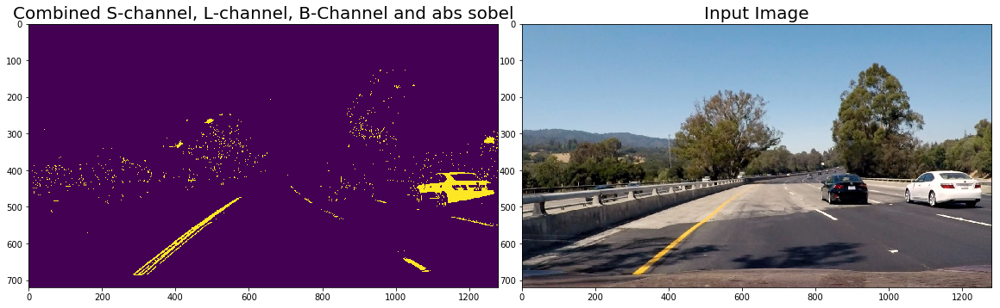

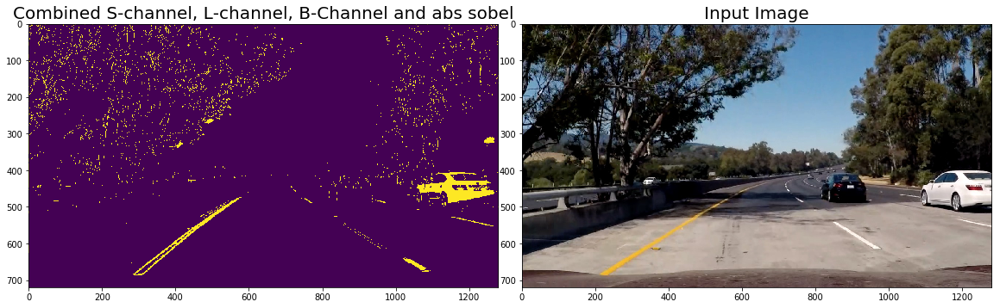

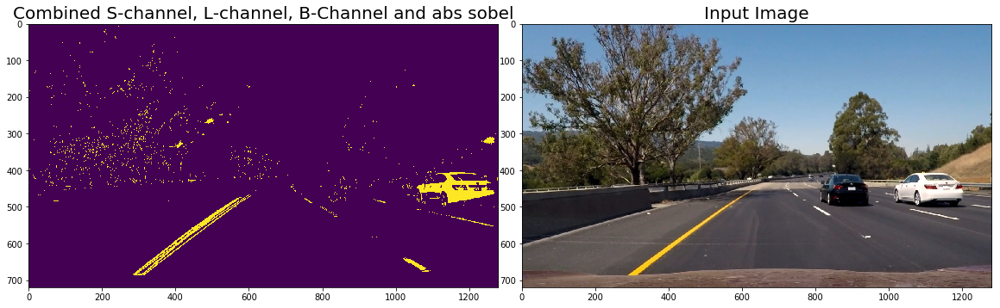

In [45]:
# Combined S-Channel and abs sobel seems to show the lines clearly.
# Test with other images

images = glob.glob('./test_images/*.jpg')


for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    sx_binary = abs_sobel_thresh(img)
    s_binary = hls_sthresh(img)
    r_binary = rgb_rthresh(img)
    combined_binary = np.zeros_like(s_binary)
    combined_binary[((s_binary == 1) & (sx_binary == 1)) | ((lbinary == 1) | (bbinary == 1))] = 1

    display_side_by_side(combined_binary, img, "Combined S-channel, L-channel, B-Channel and abs sobel", "Input Image")


plt.show()

In [46]:
# Perspective transform
def perspective_transform(img):
    
    
    src = np.float32([[500, 480],[800, 480],
                      [1200, 720],[40, 720]])
    
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size)
    return warped, Minv


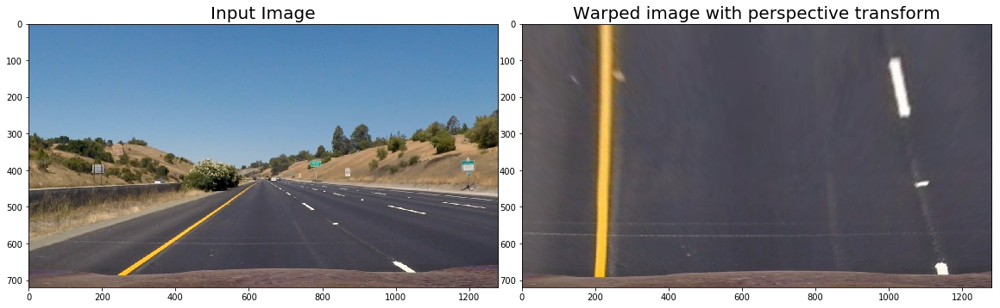

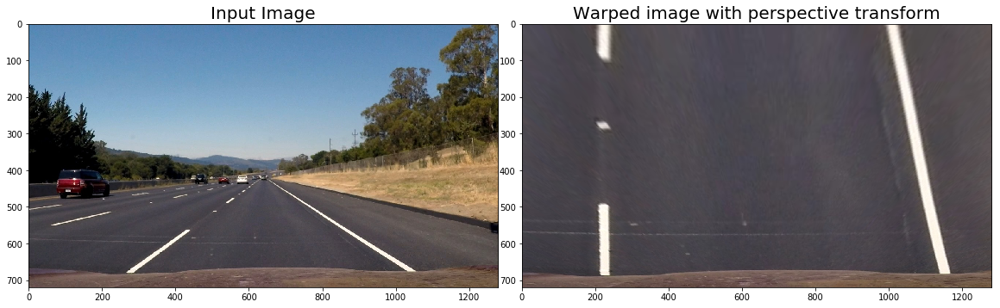

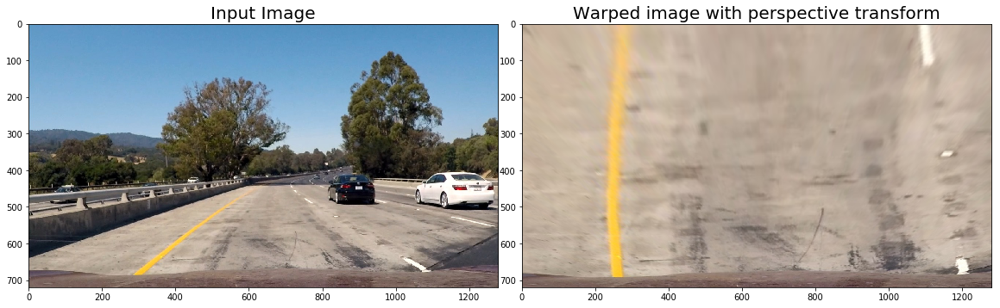

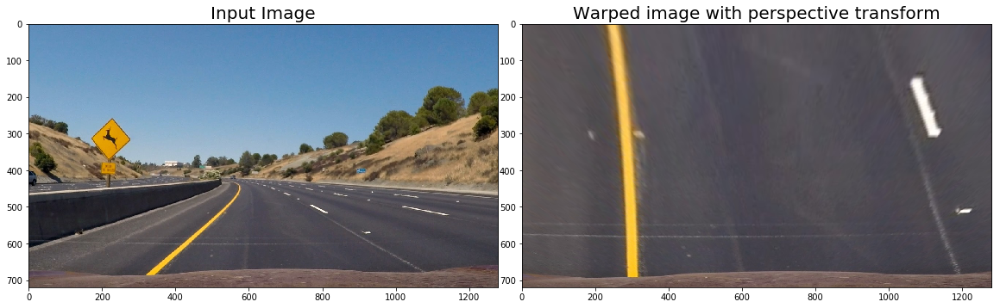

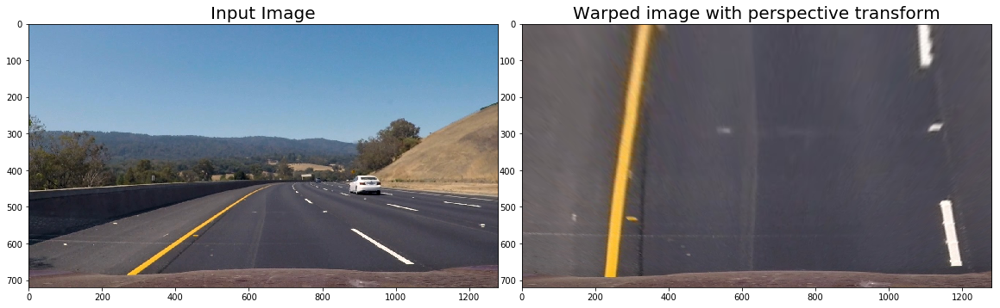

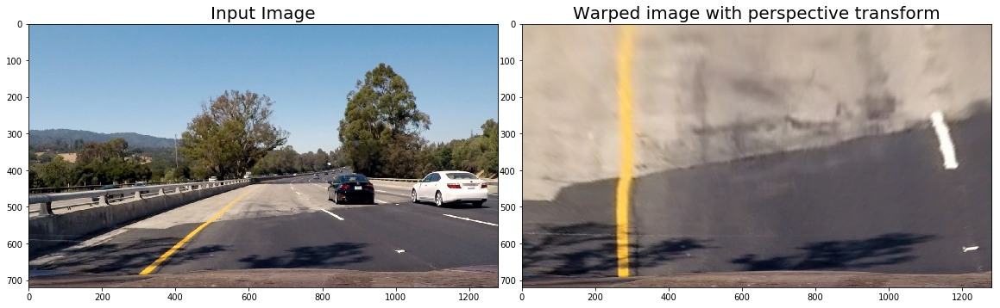

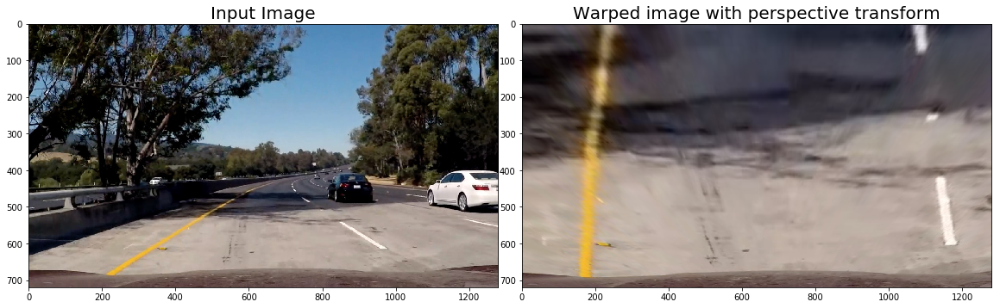

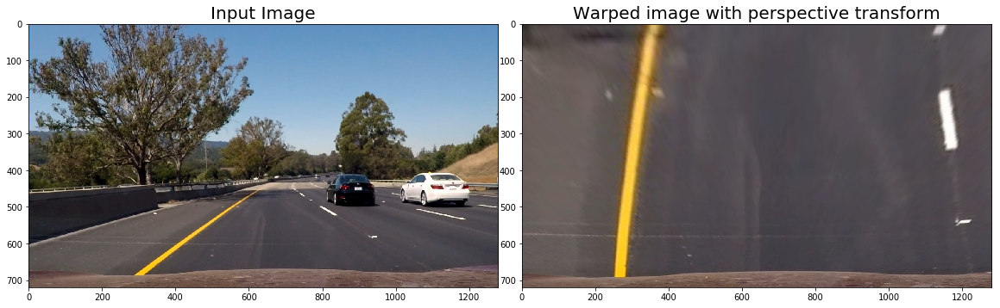

In [47]:
# test perspective transform

images = glob.glob('./test_images/*.jpg')


for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    warped, Minv = perspective_transform(img)
    display_side_by_side(img, warped, "Input Image", "Warped image with perspective transform")


plt.show()

In [48]:
def pipeline_process_image(img):
    udst = undistort(img)
    sx_binary = abs_sobel_thresh(udst)
    s_binary = hls_sthresh(udst)
    smbinary = magnitude_thresh(udst)
    sdbinary = directional_thresh(udst)
    lbinary = luv_lthresh(udst)
    bbinary = lab_bthresh(udst)
    rbinary = rgb_rthresh(udst)
    
    combined_binary = np.zeros_like(s_binary)
   # combined_binary[((s_binary == 1) | (sx_binary == 1))] = 1
    combined_binary[((s_binary == 1) & (sx_binary == 1)) | ((lbinary == 1) | (bbinary == 1))] = 1
    #combined_binary[((s_binary == 1) & (sx_binary == 1)) | ((sx_binary == 1) & (r_binary == 1)) | ((s_binary == 1) & (r_binary == 1))] = 1
    warped, Minv = perspective_transform(combined_binary)
    return warped, Minv
    

Image: Input image 


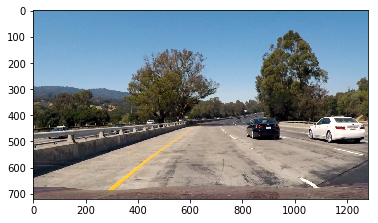

Image: Image processed output 


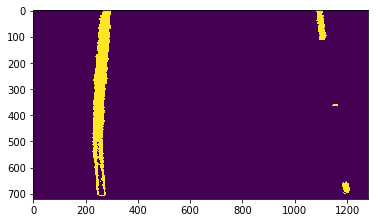

Image: Input image 


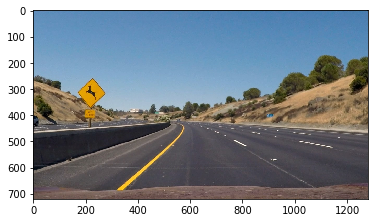

Image: Image processed output 


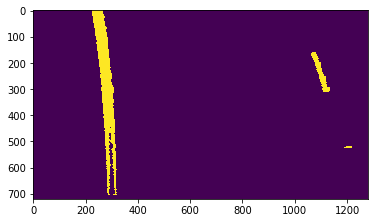

True

In [55]:
img = cv2.imread('./test_images/test1.jpg')
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
new_img, Minv = pipeline_process_image(img1)
print('Image: Input image ')
plt.imshow(img1)
plt.show()

print('Image: Image processed output ')
plt.imshow(new_img)
plt.show()
cv2.imwrite('./output_images/test1_image_processed.jpg', new_img)



img = cv2.imread('./test_images/test2.jpg')
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
new_img, Minv = pipeline_process_image(img1)
print('Image: Input image ')
plt.imshow(img1)
plt.show()

print('Image: Image processed output ')
plt.imshow(new_img)
plt.show()
cv2.imwrite('./output_images/test2_image_processed.jpg', new_img)



In [56]:
# Calculate radius of curvature

def find_curvature_and_car_position(out_img, ploty, leftx, rightx, lefty, righty):
    y_eval = np.max(ploty)
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    
    # Calculate position of the car  
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    l_fit = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    r_fit = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    lane_midpoint_position = (r_fit[719] + l_fit[719]) / 2
    center_of_image = 640 # assuming camare is mounted at the center of the car
    distance_from_center = abs((center_of_image - lane_midpoint_position)* xm_per_pix) 
    
    return left_curverad, right_curverad, distance_from_center


In [57]:
# Fine lane lines

def find_lines(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    left_curverad, right_curverad, distance_from_center = find_curvature_and_car_position(out_img, ploty, leftx, rightx, lefty, righty)

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return left_fitx, right_fitx, out_img, ploty, left_curverad, right_curverad, distance_from_center

Image: Input image 


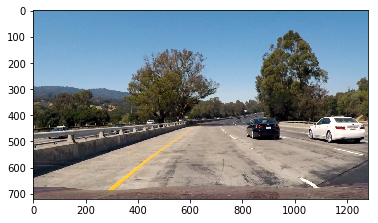

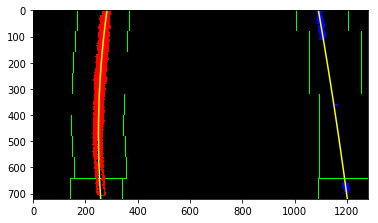

In [61]:

# Test find_lines()
img = cv2.imread('./test_images/test1.jpg')
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
warped, Minv = pipeline_process_image(img1)
print('Image: Input image ')
plt.imshow(img1)
plt.show()

left_fitx, right_fitx, out_img, ploty, left_curverad, right_curverad, distance_from_center = find_lines(warped)

# Draw lines
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.show()


In [62]:
# Create an image to draw the lines on
def draw_poly(warped, orig_image, ploty, left_fitx, right_fitx, Minv, left_curverad, right_curverad, distance_from_center):
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (orig_image.shape[1], orig_image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(orig_image, 1, newwarp, 0.3, 0)
    # print(left_curvature, 'm', right_curvature, 'm')
    
    font = cv2.FONT_HERSHEY_DUPLEX
    font_color = (255, 255, 255)
    cv2.putText(result, 'Left Curvature: {:.0f} m'.format(left_curverad), (50, 50), font, 1.5, font_color, 2)
    cv2.putText(result, 'Right Curvature: {:.0f} m'.format(right_curverad), (50, 100), font, 1.5, font_color, 2)
    if (distance_from_center > 0):
        side = "right"
    else:
        side = "left"
    text = 'Car is {:.2f}'.format(abs(distance_from_center)) + 'm ' + side + ' of center'
    cv2.putText(result, text, (50, 150), font, 1.5, font_color, 2)

    return result




Image: Input image 


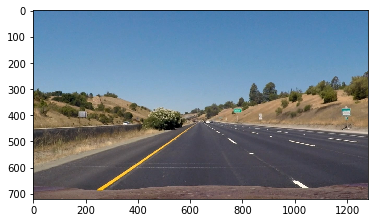

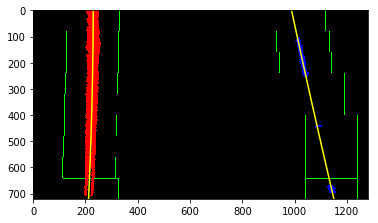

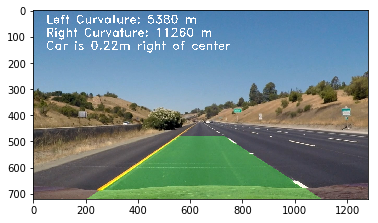

Image: Input image 


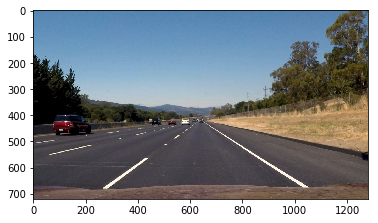

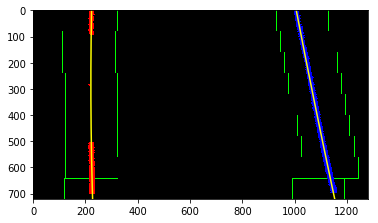

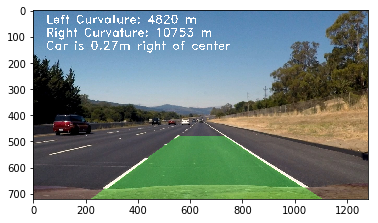

Image: Input image 


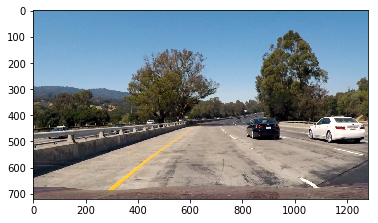

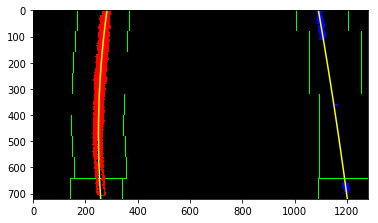

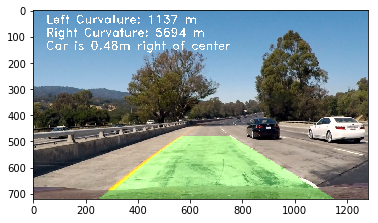

Image: Input image 


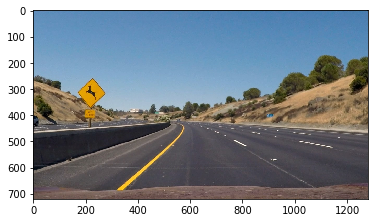

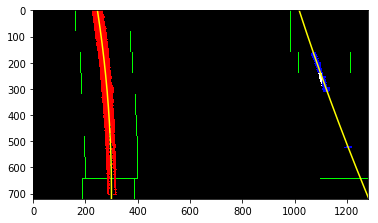

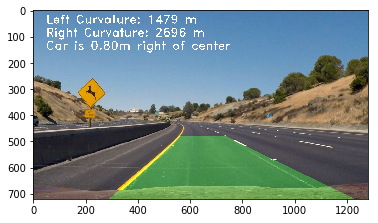

Image: Input image 


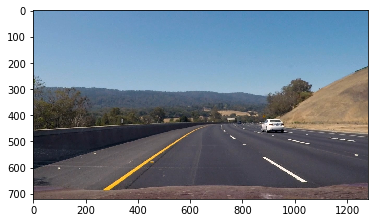

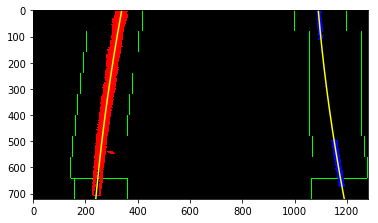

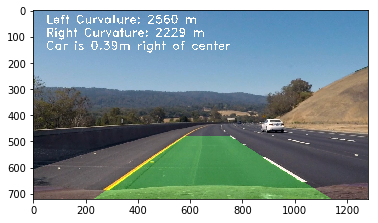

Image: Input image 


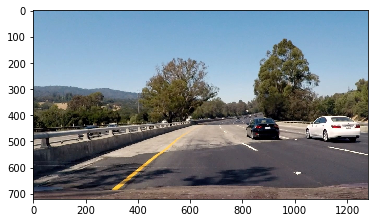

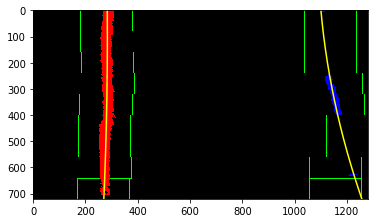

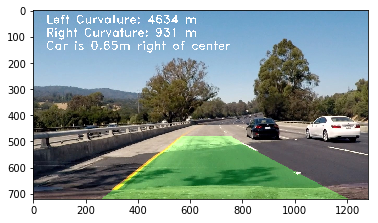

Image: Input image 


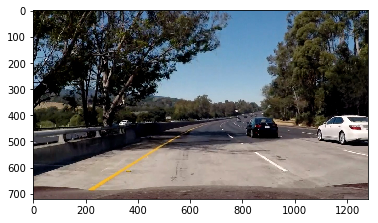

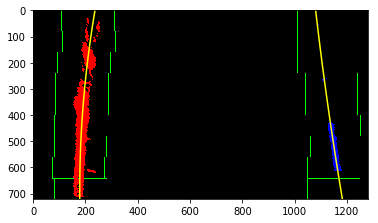

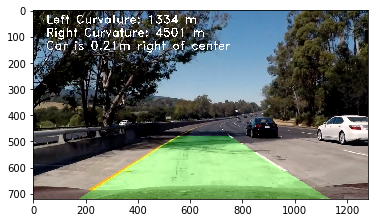

Image: Input image 


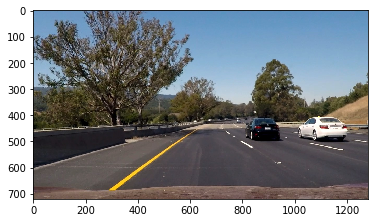

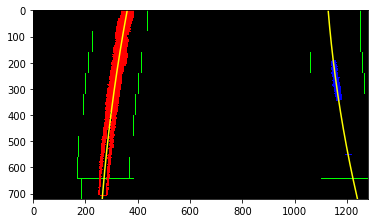

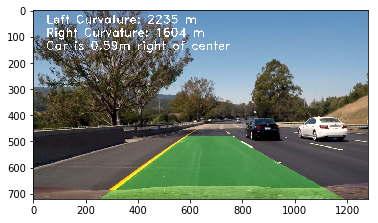

In [63]:
#Test pipeline with find_lines() and drwa_poly()


images = glob.glob('./test_images/*.jpg')

for idx, fname in enumerate(images):
    
    img = cv2.imread(fname)
    img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    warped, Minv = pipeline_process_image(img1)
    print('Image: Input image ')
    plt.imshow(img1)
    plt.show()
       
    left_fitx, right_fitx, out_img, ploty, left_curverad, right_curverad, distance_from_center = find_lines(warped)
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()
    
    result = draw_poly(warped, img1, ploty, left_fitx, right_fitx, Minv, left_curverad, right_curverad, distance_from_center)
    plt.imshow(result)
    plt.show()



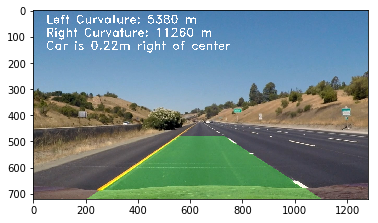

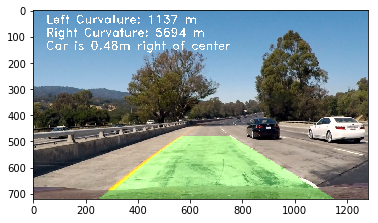

In [64]:

def process_image_for_video(img1):
    warped, Minv = pipeline_process_image(img1)

       
    left_fitx, right_fitx, out_img, ploty, left_curverad, right_curverad, distance_from_center = find_lines(warped)
    
    result = draw_poly(warped, img1, ploty, left_fitx, right_fitx, Minv, left_curverad, right_curverad, distance_from_center)
 
    return result


# Test pipeline created for video
fname = './test_images/straight_lines1.jpg'
img = cv2.imread(fname)
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
result = process_image_for_video(img1)
plt.imshow(result)
plt.show()


fname = './test_images/test1.jpg'
img = cv2.imread(fname)
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
result = process_image_for_video(img1)
plt.imshow(result)
plt.show()




In [65]:
import imageio
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_output = 'output_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(process_image_for_video) 
video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4


100%|█████████▉| 1260/1261 [03:45<00:00,  5.58it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 



In [66]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))